In [1]:

import tensorflow as tf
import datetime, os
import numpy as np
import os
import matplotlib.pyplot as plt

import scipy.ndimage


import tensorflow.keras.preprocessing as kp
import pathlib
import random


from tensorflow.keras import datasets, layers, models

import pandas as pd
#import tqdm
from PIL import Image
from sklearn.model_selection import train_test_split


import numpy as np

from tensorflow import keras

# Display
from IPython.display import display


import math
import matplotlib.cm as cm
from tensorflow.keras.layers import Input, Dense, Activation,BatchNormalization, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.models import Model



In [2]:
#tf.__version__
tf.__version__

'2.8.0'

In [3]:
folder=""
imageType=""
cropText="NoCrop"
modelName="EfNetB0"


In [4]:
folderTrain= folder + 'Train' + imageType
X_train=[]
y_train=[]
imageSize=(224,224)
for i in os.listdir(folderTrain):
    X_train.append(np.array(Image.open(folderTrain+i).resize(imageSize)))
    y_train.append(i[:5])
X_train=np.array(X_train)
print(y_train[:3])

['FL_00', 'FL_00', 'FL_00']


In [5]:
X_train, X_val, y_train, y_val  = train_test_split(X_train,y_train,test_size = (208/1008),random_state=13,stratify=y_train)
print(X_train.shape)
print(X_val.shape)

(800, 224, 224, 3)
(208, 224, 224, 3)


In [6]:
y_train_hot_r = np.array([[1,0,0,0] if x[-2:] == '00' 
                       else [0,1,0,0] if x[-2:] == '09' 
                       else [0,0,1,0] if x[-2:] == '18' 
                       else [0,0,0,1] for x in y_train])
y_train_hot_f = np.array([[0,1] if x[:2] == 'FL' else [1,0] for x in y_train])
y_val_hot_r = np.array([[1,0,0,0] if x[-2:] == '00' 
                        else [0,1,0,0] if x[-2:] == '09' 
                        else [0,0,1,0] if x[-2:] == '18' 
                        else [0,0,0,1] for x in y_val])
y_val_hot_f = np.array([[0,1] if x[:2] == 'FL' else [1,0] for x in y_val])


In [7]:
import copy
def imageRotationCorrection(images,orientations):
    images=copy.deepcopy(images)
    for image in range(len(images)):
        if orientations[image][-2:] != '00':
            #print(f"{keys[r]}, {cnt[keys[r]]}, {rot:<30}")
            if(orientations[image][-2:])==  '09':
                images[image] = np.rot90(images[image])
            elif(orientations[image][-2:])==  '18':
                images[image]=np.rot90(images[image],k=2)
            elif(orientations[image][-2:])==  '27':
                images[image]=np.rot90(images[image],k=3)
    return images

In [8]:
#print(y_val)
X_train_f=imageRotationCorrection(X_train,y_train)
X_val_f=imageRotationCorrection(X_val,y_val)



In [9]:

from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from tensorflow.keras.utils import to_categorical


labels = ['FL_00','FL_09','FL_18','FL_27','NF_00','NF_09','NF_18','NF_27']
# integer_encoded_reshape = integer_encoded.reshape(len(integer_encoded), 1)
onehot_encoder = OneHotEncoder(sparse=False)

y_train_hot = to_categorical(LabelEncoder().fit_transform(y_train).reshape(len(y_train),1))

y_val_hot = to_categorical((LabelEncoder().fit_transform(y_val).reshape(len(y_val),1)))


In [10]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=.1, patience=4, restore_best_weights=True)

## MobNet Rotate

In [11]:

from keras.applications.efficientnet import preprocess_input, EfficientNetB0


input_l=layers.Input(shape=(224,224,3))
    
base_model = EfficientNetB0(include_top = False, input_tensor=input_l, input_shape = (224,224,3))
base_model.trainable=False;
print(base_model.layers[-1].name)

flat_l=layers.Flatten()(base_model.get_layer(base_model.layers[-1].name).output)
predict_l=layers.Dense(4,activation='softmax')(flat_l)
model_r=Model(inputs=input_l, outputs=predict_l)
model_r.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['categorical_accuracy'])  
#model_r.add(base_model_r)

#model_r.add(layers.Flatten())
#model_r.add(layers.Dense(4,activation='softmax'))
#model.name="ResNet50"
#model_r.summary()

top_activation


In [12]:
history_r = model_r.fit(x=preprocess_input(X_train),y=y_train_hot_r, validation_data =(preprocess_input(X_val), y_val_hot_r), epochs = 20, verbose = 2, callbacks=[callback])

Epoch 1/20
25/25 - 34s - loss: 0.2876 - categorical_accuracy: 0.9350 - val_loss: 7.2578e-06 - val_categorical_accuracy: 1.0000 - 34s/epoch - 1s/step
Epoch 2/20
25/25 - 24s - loss: 8.2661e-06 - categorical_accuracy: 1.0000 - val_loss: 3.7824e-06 - val_categorical_accuracy: 1.0000 - 24s/epoch - 953ms/step
Epoch 3/20
25/25 - 24s - loss: 1.8736e-04 - categorical_accuracy: 1.0000 - val_loss: 2.9674e-06 - val_categorical_accuracy: 1.0000 - 24s/epoch - 973ms/step
Epoch 4/20
25/25 - 24s - loss: 1.1096e-06 - categorical_accuracy: 1.0000 - val_loss: 2.8282e-06 - val_categorical_accuracy: 1.0000 - 24s/epoch - 947ms/step
Epoch 5/20
25/25 - 24s - loss: 2.4906e-06 - categorical_accuracy: 1.0000 - val_loss: 2.3859e-06 - val_categorical_accuracy: 1.0000 - 24s/epoch - 953ms/step


In [13]:
base_model.trainable = True

# It's important to recompile your model after you make any changes
# to the `trainable` attribute of any inner layer, so that your changes
# are take into account
model_r.compile(loss='categorical_crossentropy', optimizer=keras.optimizers.Adam(1e-4), metrics=['categorical_accuracy'])  



In [14]:
history_r2 = model_r.fit(x=preprocess_input(X_train),y=y_train_hot_r, validation_data =(preprocess_input(X_val), y_val_hot_r), epochs = 20, verbose = 2, callbacks=[callback])

Epoch 1/20
25/25 - 109s - loss: 0.0267 - categorical_accuracy: 0.9912 - val_loss: 2.5790e-08 - val_categorical_accuracy: 1.0000 - 109s/epoch - 4s/step
Epoch 2/20
25/25 - 101s - loss: 0.0033 - categorical_accuracy: 0.9987 - val_loss: 3.4387e-09 - val_categorical_accuracy: 1.0000 - 101s/epoch - 4s/step
Epoch 3/20
25/25 - 99s - loss: 1.7802e-05 - categorical_accuracy: 1.0000 - val_loss: 2.8656e-09 - val_categorical_accuracy: 1.0000 - 99s/epoch - 4s/step
Epoch 4/20
25/25 - 99s - loss: 8.3213e-04 - categorical_accuracy: 1.0000 - val_loss: 2.5217e-08 - val_categorical_accuracy: 1.0000 - 99s/epoch - 4s/step
Epoch 5/20
25/25 - 102s - loss: 2.9157e-04 - categorical_accuracy: 1.0000 - val_loss: 1.1066e-06 - val_categorical_accuracy: 1.0000 - 102s/epoch - 4s/step


In [15]:
print(history_r.history['val_categorical_accuracy'])
print(history_r2.history['val_categorical_accuracy'])

[1.0, 1.0, 1.0, 1.0, 1.0]
[1.0, 1.0, 1.0, 1.0, 1.0]


## AlexNet Flip

In [16]:

input_l=layers.Input(shape=(224,224,3))
    
base_model_f = EfficientNetB0(include_top = False, input_tensor=input_l, input_shape = (224,224,3))   

base_model_f.trainable=False;
print(base_model_f.layers[-1].name)

flat_f=layers.Flatten()(base_model_f.get_layer(base_model_f.layers[-1].name).output)
predict_f=layers.Dense(2,activation='softmax')(flat_f)
model_f=Model(inputs=input_l, outputs=predict_f)



model_f.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['categorical_accuracy'])  


top_activation


In [17]:
history_f = model_f.fit(x=preprocess_input(X_train_f),y=y_train_hot_f, validation_data =(preprocess_input(X_val_f), y_val_hot_f), epochs = 20, verbose = 2, callbacks=[callback])

Epoch 1/20
25/25 - 33s - loss: 1.4372 - categorical_accuracy: 0.6975 - val_loss: 0.5057 - val_categorical_accuracy: 0.8365 - 33s/epoch - 1s/step
Epoch 2/20
25/25 - 26s - loss: 0.2235 - categorical_accuracy: 0.9162 - val_loss: 0.2053 - val_categorical_accuracy: 0.9375 - 26s/epoch - 1s/step
Epoch 3/20
25/25 - 25s - loss: 0.1000 - categorical_accuracy: 0.9638 - val_loss: 0.1829 - val_categorical_accuracy: 0.9423 - 25s/epoch - 996ms/step
Epoch 4/20
25/25 - 25s - loss: 0.0431 - categorical_accuracy: 0.9887 - val_loss: 0.1301 - val_categorical_accuracy: 0.9567 - 25s/epoch - 988ms/step
Epoch 5/20
25/25 - 25s - loss: 0.0259 - categorical_accuracy: 0.9900 - val_loss: 0.3388 - val_categorical_accuracy: 0.9231 - 25s/epoch - 1s/step
Epoch 6/20
25/25 - 25s - loss: 0.0475 - categorical_accuracy: 0.9825 - val_loss: 0.3827 - val_categorical_accuracy: 0.9183 - 25s/epoch - 996ms/step


In [18]:
base_model_f.trainable = True

# It's important to recompile your model after you make any changes
# to the `trainable` attribute of any inner layer, so that your changes
# are take into account
model_f.compile(loss='categorical_crossentropy', optimizer=keras.optimizers.Adam(1e-4), metrics=['categorical_accuracy'])  



In [19]:
history_f2 = model_f.fit(x=preprocess_input(X_train_f),y=y_train_hot_f, validation_data =(preprocess_input(X_val_f), y_val_hot_f), epochs = 20, verbose = 2, callbacks=[callback])

Epoch 1/20
25/25 - 112s - loss: 0.6540 - categorical_accuracy: 0.8288 - val_loss: 0.3656 - val_categorical_accuracy: 0.8942 - 112s/epoch - 4s/step
Epoch 2/20
25/25 - 101s - loss: 0.0909 - categorical_accuracy: 0.9688 - val_loss: 0.1931 - val_categorical_accuracy: 0.9519 - 101s/epoch - 4s/step
Epoch 3/20
25/25 - 103s - loss: 0.0338 - categorical_accuracy: 0.9887 - val_loss: 0.1940 - val_categorical_accuracy: 0.9615 - 103s/epoch - 4s/step
Epoch 4/20
25/25 - 98s - loss: 0.0127 - categorical_accuracy: 0.9950 - val_loss: 0.2466 - val_categorical_accuracy: 0.9519 - 98s/epoch - 4s/step
Epoch 5/20
25/25 - 102s - loss: 0.0112 - categorical_accuracy: 0.9987 - val_loss: 0.3141 - val_categorical_accuracy: 0.9471 - 102s/epoch - 4s/step
Epoch 6/20
25/25 - 128s - loss: 0.0068 - categorical_accuracy: 0.9962 - val_loss: 0.3670 - val_categorical_accuracy: 0.9423 - 128s/epoch - 5s/step


In [20]:
print(history_f.history['val_categorical_accuracy'])
print(history_f2.history['val_categorical_accuracy'])

[0.8365384340286255, 0.9375, 0.942307710647583, 0.9567307829856873, 0.9230769276618958, 0.9182692170143127]
[0.8942307829856873, 0.9519230723381042, 0.9615384340286255, 0.9519230723381042, 0.9471153616905212, 0.942307710647583]


## Running on TestSet

In [21]:
folderTest= folder + 'Test' + imageType
X_test=[]
y_test=[]
imageSize=(224,224)
for i in os.listdir(folderTest):
    X_test.append(np.array(Image.open(folderTest+i).resize(imageSize)))
    y_test.append(i[:5])
X_test=np.array(X_test)
y_test_r=[x[-2:] for x in y_test]
y_test_f=[x[:2] for x in y_test]

In [22]:
y_test_hot_r = np.array([[1,0,0,0] if x[-2:] == '00' 
                       else [0,1,0,0] if x[-2:] == '09' 
                       else [0,0,1,0] if x[-2:] == '18' 
                       else [0,0,0,1] for x in y_test])
y_test_hot_f = np.array([[0,1] if x[:2] == 'FL' else [1,0] for x in y_test])

In [23]:
y_test_hot = to_categorical((LabelEncoder().fit_transform(y_test).reshape(len(y_test),1)))

In [24]:
print(X_train.shape)
print(X_test.shape)


(800, 224, 224, 3)
(240, 224, 224, 3)


In [25]:
score_r = model_r.evaluate(x=preprocess_input(X_test), y=y_test_hot_r)


8/8 [==============================] - 8s 1s/step - loss: 0.2126 - categorical_accuracy: 0.9958


In [26]:
test_predictions_r=model_r.predict(preprocess_input(X_test))


In [27]:
labels_r=['00','09','18','27']
test_pred_labels_r=[labels_r[x] for x in np.argmax(test_predictions_r, axis=1)]

In [28]:
X_test_f=imageRotationCorrection(X_test,test_pred_labels_r)
X_test_just_f=imageRotationCorrection(X_test,y_test)

In [29]:
score_f = model_f.evaluate(x=preprocess_input(X_test_just_f), y=y_test_hot_f)


8/8 [==============================] - 8s 936ms/step - loss: 0.2482 - categorical_accuracy: 0.9333


In [30]:
test_predictions_f=model_f.predict(preprocess_input(X_test_f))

In [31]:
labels_f=['NF','FL']
test_pred_labels_f=[labels_f[x] for x in np.argmax(test_predictions_f, axis=1)]
test_pred_combined=[]
for i in range(len(test_pred_labels_f)):
    test_pred_combined.append(f'{test_pred_labels_f[i]}_{test_pred_labels_r[i]}')
print(test_pred_combined[:3])

['FL_00', 'FL_00', 'FL_00']


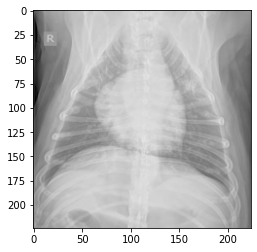

In [32]:
plt.imshow(X_test_f[160])

## Visualizing Results

In [33]:
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from tensorflow.keras.utils import to_categorical
print(score_r)
print(score_f)
print(len(y_test))
print(len(test_pred_combined))
print(len(test_pred_labels_r))
print(len(test_pred_labels_f))
y_test_hot = to_categorical((LabelEncoder().fit_transform(y_test).reshape(len(y_test),1)))
y_pred_hot = to_categorical((LabelEncoder().fit_transform(test_pred_combined).reshape(len(test_pred_combined),1)))
metric_total = tf.keras.metrics.CategoricalAccuracy()
metric_total.update_state(y_test_hot,y_pred_hot)
print(metric_total.result().numpy())


[0.21259352564811707, 0.9958333373069763]
[0.2482486069202423, 0.9333333373069763]
240
240
240
240
0.93333334


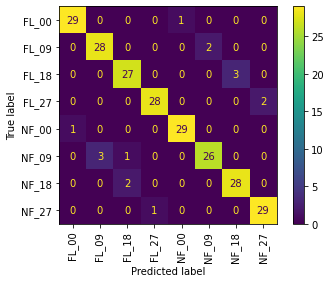

In [34]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
disp_r = ConfusionMatrixDisplay.from_predictions(y_test,test_pred_combined,xticks_rotation="vertical")
#disp_r.ax_.set_title(title)

plt.show()

## Grad-CAM

In [35]:
def get_img_array(img_path, size):
    # `img` is a PIL image of size 299x299
    img = keras.preprocessing.image.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array


def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

In [36]:
model_r.save(f'SavedModels/model{modelName}_220405_{imageType[:-1]}_r.h5')
model_f.save(f'SavedModels/model{modelName}_220405_{imageType[:-1]}_f.h5')
#plt.savefig(f'outputFigures/ConfMat_{model_save_as}.jpg')

In [37]:
#model_r = tf.keras.models.load_model("c:/Users/jehui/OneDrive/Desktop/MastersProject/notebooks/AlxNet/SavedModels/modelAlxNet_220405_jpeg_r.h5")
#model_r.summary()
#model_r.evaluate(x=X_test, y=y_test_hot_r)


In [38]:
#model.layers[0].summary()
for i in range(len(model_r.layers)):
    if (i < len(model_r.layers[:-30])):
        continue
    
    layer = model_r.layers[i]
    
    # check for convolutional layer
    #if 'conv' not in layer.name:
    #    continue
    # summarize output shape
    print(i, layer.name, layer.output.shape)


209 block6d_dwconv (None, 7, 7, 1152)
210 block6d_bn (None, 7, 7, 1152)
211 block6d_activation (None, 7, 7, 1152)
212 block6d_se_squeeze (None, 1152)
213 block6d_se_reshape (None, 1, 1, 1152)
214 block6d_se_reduce (None, 1, 1, 48)
215 block6d_se_expand (None, 1, 1, 1152)
216 block6d_se_excite (None, 7, 7, 1152)
217 block6d_project_conv (None, 7, 7, 192)
218 block6d_project_bn (None, 7, 7, 192)
219 block6d_drop (None, 7, 7, 192)
220 block6d_add (None, 7, 7, 192)
221 block7a_expand_conv (None, 7, 7, 1152)
222 block7a_expand_bn (None, 7, 7, 1152)
223 block7a_expand_activation (None, 7, 7, 1152)
224 block7a_dwconv (None, 7, 7, 1152)
225 block7a_bn (None, 7, 7, 1152)
226 block7a_activation (None, 7, 7, 1152)
227 block7a_se_squeeze (None, 1152)
228 block7a_se_reshape (None, 1, 1, 1152)
229 block7a_se_reduce (None, 1, 1, 48)
230 block7a_se_expand (None, 1, 1, 1152)
231 block7a_se_excite (None, 7, 7, 1152)
232 block7a_project_conv (None, 7, 7, 320)
233 block7a_project_bn (None, 7, 7, 320)
234 

In [39]:

def save_and_display_gradcam(img, heatmap,actualClass, predictedClass, cam_path="cam.jpg", alpha=0.4):
    # Load the original image

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.preprocessing.image.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
    plt.title(f"Truth: {actualClass}\nPredicted: {predictedClass}")
    plt.imshow(superimposed_img)
    plt.show()


#save_and_display_gradcam(img[0], heatmap)

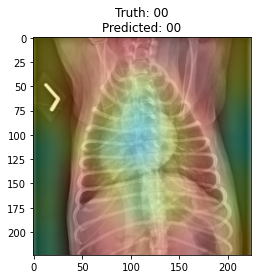

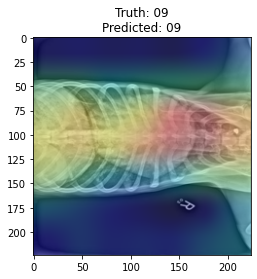

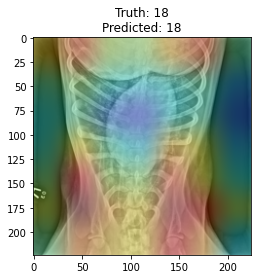

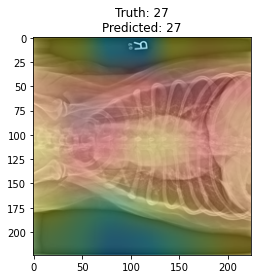

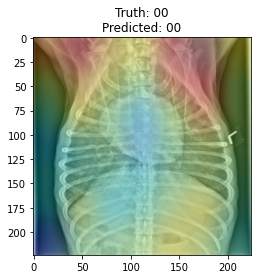

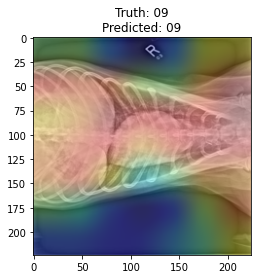

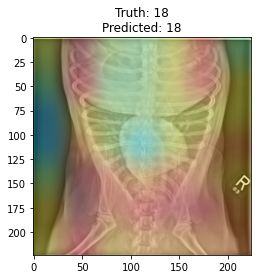

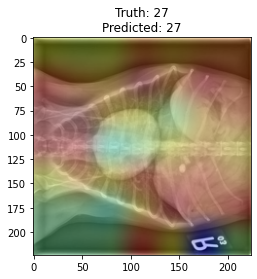

In [40]:
import shutil
imageName=""
rot=['00','09','18','27']
model_r.layers[-1].activation = None
CAMfolder=f"c:/Users/jehui/OneDrive/Desktop/MastersProject/DataSet/MIDataSplit/ForCAM/{cropText}/"
for file in os.listdir(CAMfolder):
    
    
 
    imageName=file.split('.')[0]
    img=np.array(Image.open(CAMfolder+file).resize(imageSize)).reshape(1,224,224,3)
    
    preds = model_r.predict(preprocess_input(img))
    
    save_and_display_gradcam(img[0], make_gradcam_heatmap(img, model_r, "top_conv"),imageName[3:5] , rot[preds[0].argmax()],cam_path=f"output/R_{cropText}_{rot[preds[0].argmax()]}_"+imageName+"cam.jpg" )

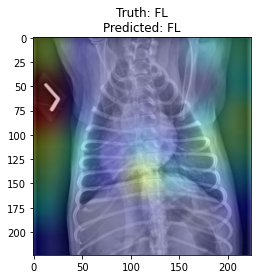

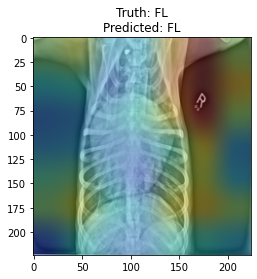

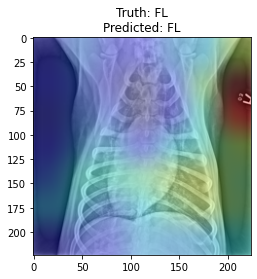

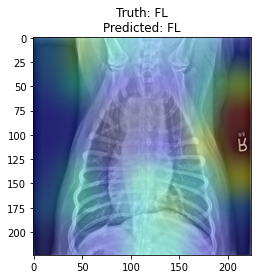

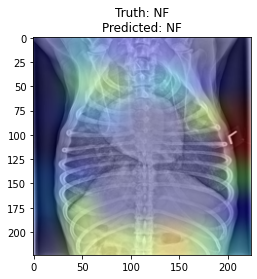

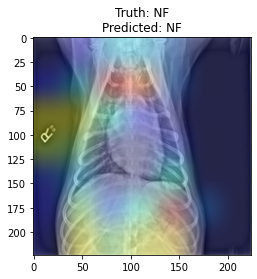

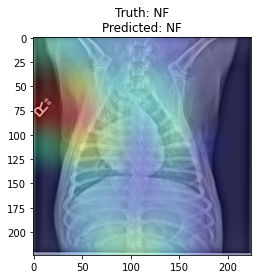

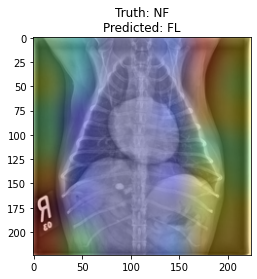

In [41]:
import shutil
imageName=""
fl=['NF','FL']
model_f.layers[-1].activation = None
CAMfolder=f"c:/Users/jehui/OneDrive/Desktop/MastersProject/DataSet/MIDataSplit/ForCAM/{cropText}/"
for file in os.listdir(CAMfolder):
    

    imageName=file.split('.')[0]
    img=np.array(Image.open(CAMfolder+file).resize(imageSize)).reshape(1,224,224,3)
    img=imageRotationCorrection(img,[imageName[3:5]])
   
    preds = model_f.predict(preprocess_input(img))
    
    save_and_display_gradcam(img[0], make_gradcam_heatmap(img, model_f, "top_conv"),imageName[0:2] , fl[preds[0].argmax()],cam_path=f"output/F_{cropText}_{fl[preds[0].argmax()]}_"+imageName+"cam.jpg" )

In [54]:
base_model_r.summary() #top_conv (Conv2D)              (None, 7, 7, 1280)   409600      ['block7a_project_bn[0][0]']   
# block7a_project_conv (Conv2D)  (None, 7, 7, 320)    368640      ['block7a_se_excite[0][0]']      

Model: "efficientnetb0"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_1[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 224, 224, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 stem_conv_pad (ZeroPadding2D)  (None, 225, 225, 3)  0           ['normalization[0][0

true: FL_00 pred: NF_00


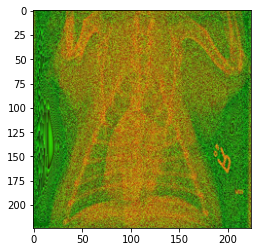

true: FL_00 pred: NF_00


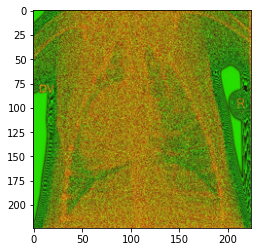

true: FL_00 pred: NF_00


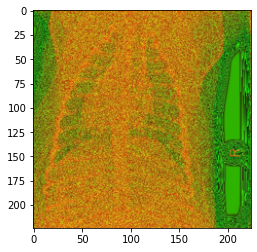

true: FL_00 pred: NF_00


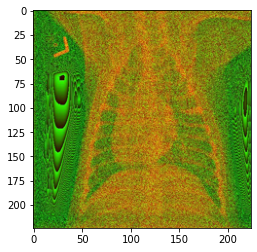

true: FL_00 pred: NF_00


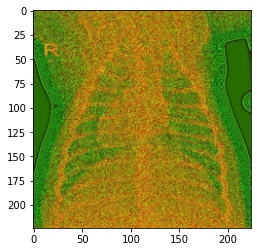

true: FL_09 pred: NF_09


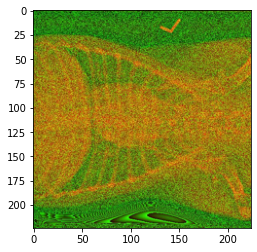

true: FL_09 pred: NF_09


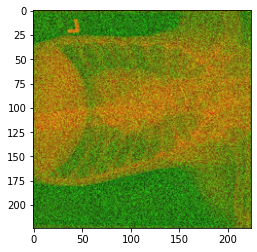

true: FL_09 pred: NF_09


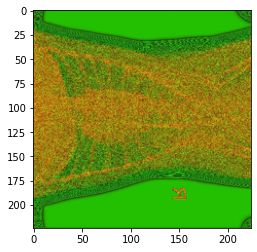

true: FL_09 pred: NF_18


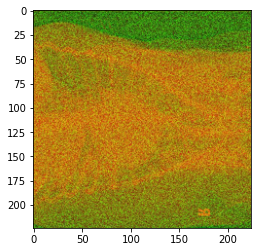

true: FL_09 pred: NF_09


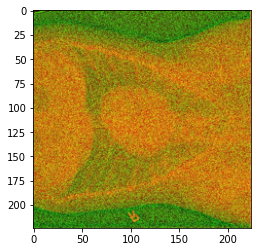

true: FL_09 pred: NF_09


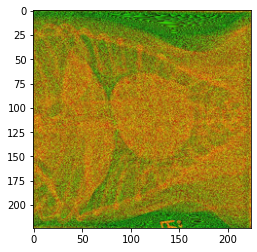

true: FL_09 pred: NF_18


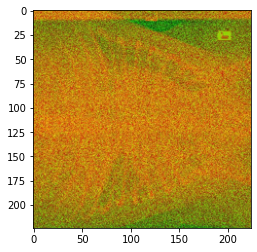

true: FL_09 pred: NF_09


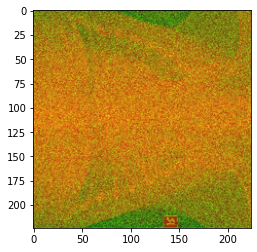

true: FL_09 pred: NF_09


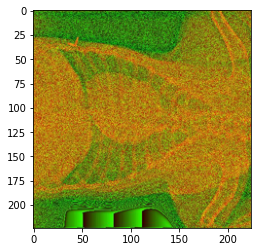

true: FL_09 pred: NF_09


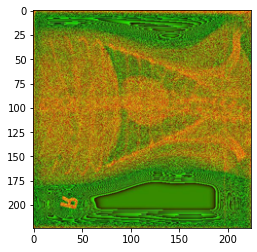

true: FL_09 pred: NF_09


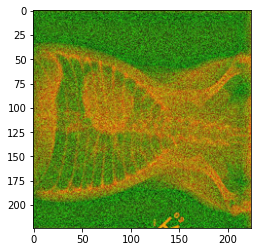

true: FL_09 pred: NF_09


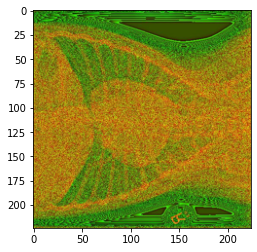

true: FL_09 pred: NF_09


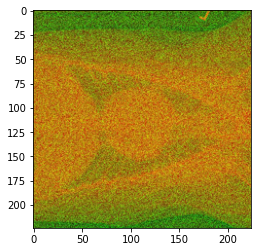

true: FL_09 pred: NF_18


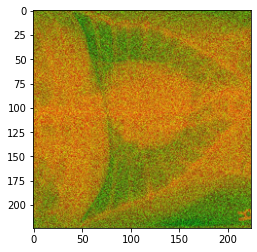

true: FL_09 pred: NF_18


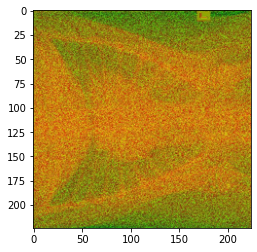

true: FL_09 pred: NF_09


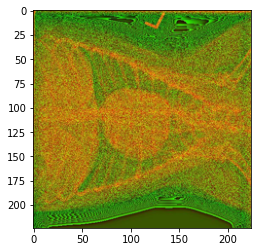

true: FL_09 pred: NF_09


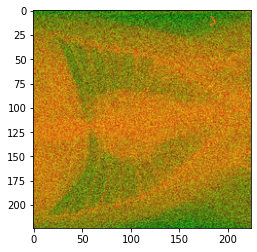

true: FL_09 pred: NF_09


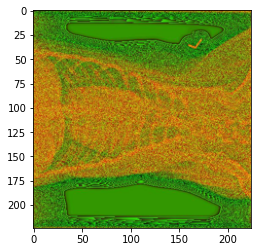

true: FL_09 pred: NF_09


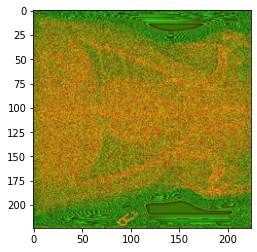

true: FL_18 pred: NF_18


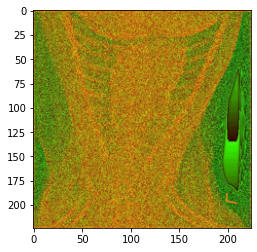

true: FL_18 pred: NF_18


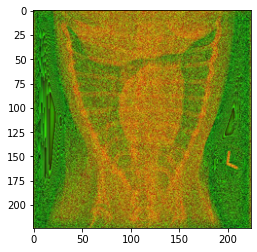

true: FL_18 pred: NF_18


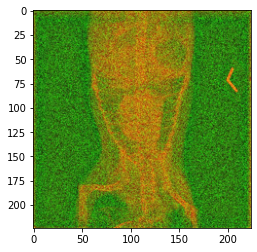

true: FL_18 pred: NF_18


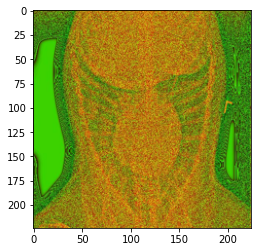

true: FL_18 pred: NF_18


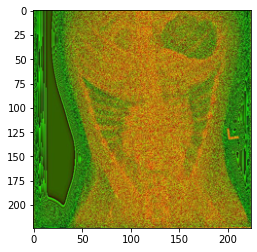

true: FL_18 pred: NF_18


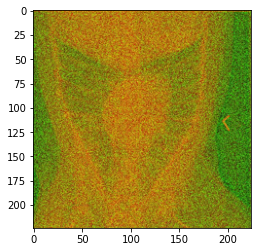

true: FL_18 pred: NF_18


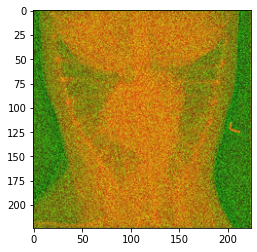

true: FL_18 pred: NF_18


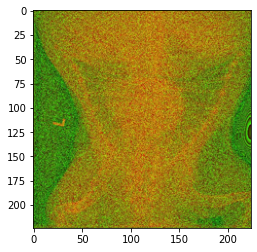

true: FL_18 pred: NF_18


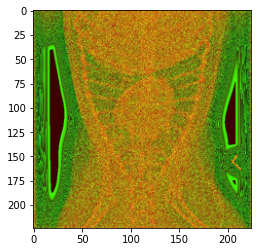

true: FL_18 pred: NF_18


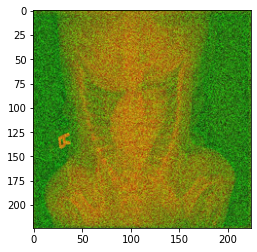

true: FL_18 pred: NF_18


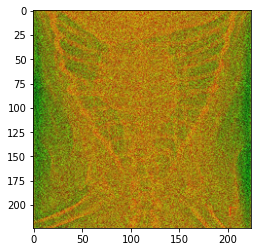

true: FL_18 pred: NF_18


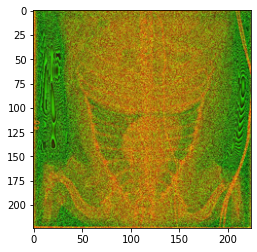

true: FL_18 pred: NF_18


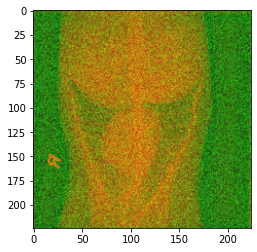

true: FL_18 pred: NF_18


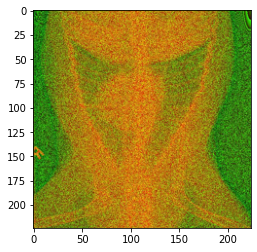

true: FL_27 pred: NF_27


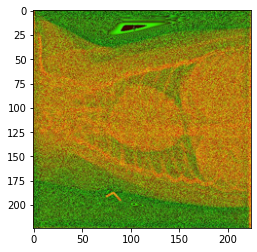

true: FL_27 pred: NF_27


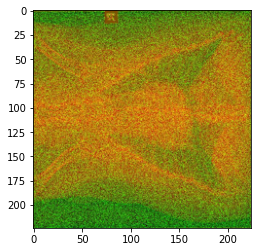

true: FL_27 pred: NF_27


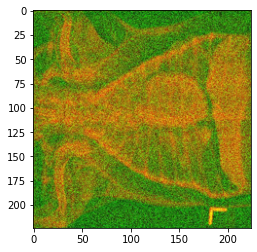

true: FL_27 pred: NF_27


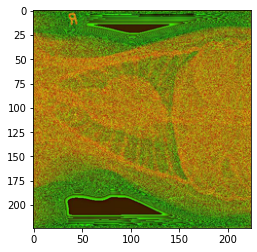

true: FL_27 pred: NF_27


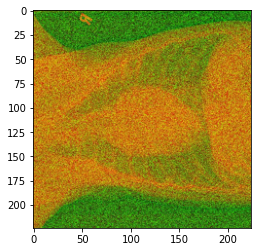

true: FL_27 pred: NF_27


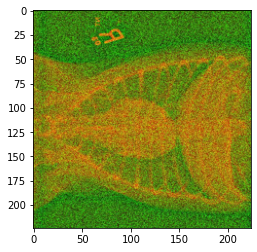

true: FL_27 pred: NF_27


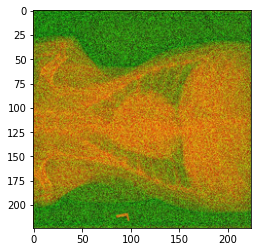

true: FL_27 pred: NF_18


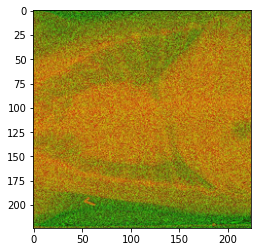

true: FL_27 pred: NF_27


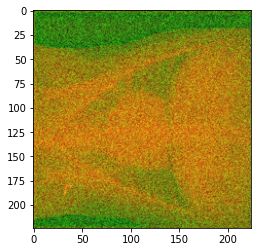

true: FL_27 pred: NF_27


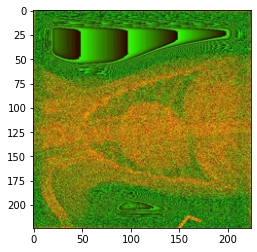

true: FL_27 pred: NF_27


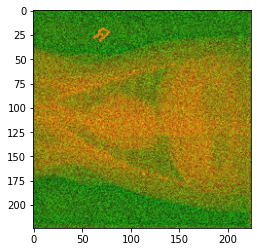

true: FL_27 pred: NF_27


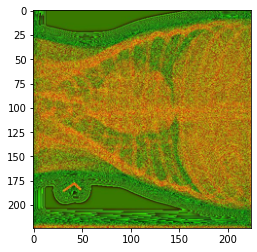

true: NF_00 pred: FL_00


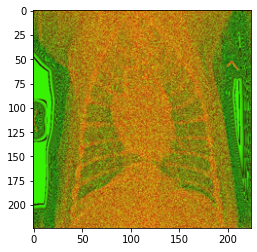

true: NF_00 pred: FL_00


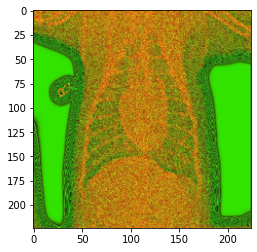

true: NF_00 pred: FL_00


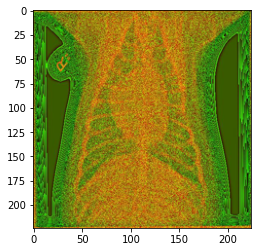

true: NF_00 pred: FL_00


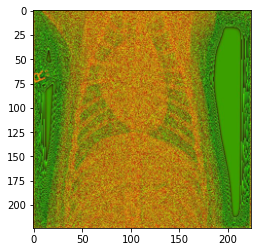

true: NF_00 pred: FL_00


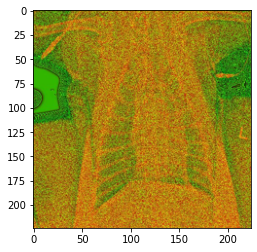

true: NF_00 pred: FL_00


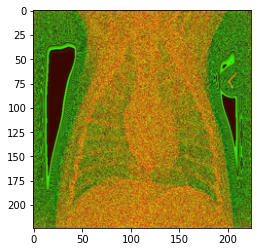

true: NF_00 pred: FL_00


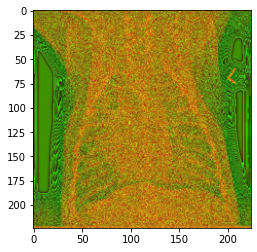

true: NF_00 pred: FL_00


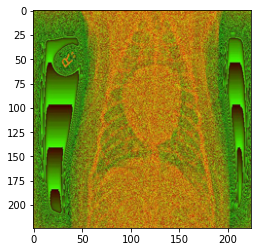

true: NF_09 pred: FL_09


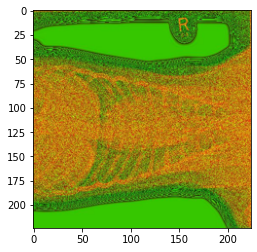

true: NF_09 pred: FL_09


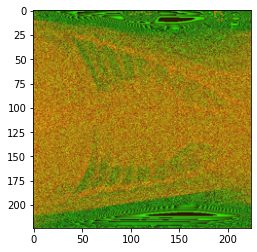

true: NF_09 pred: FL_09


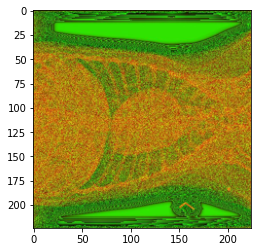

true: NF_09 pred: FL_09


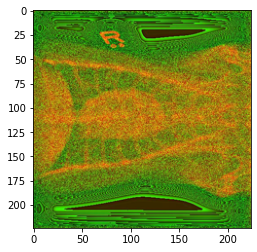

true: NF_09 pred: FL_09


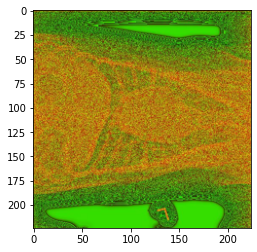

true: NF_09 pred: NF_00


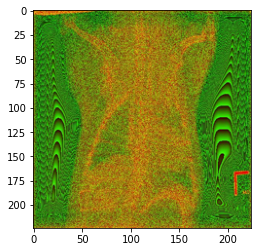

true: NF_09 pred: FL_09


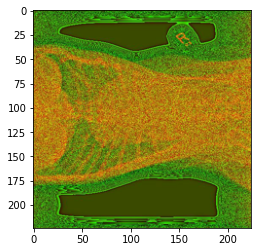

true: NF_09 pred: FL_09


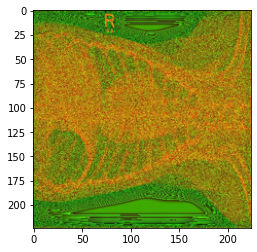

true: NF_09 pred: FL_09


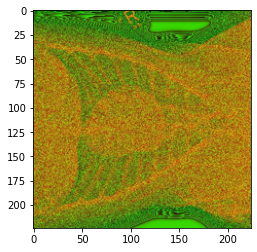

true: NF_09 pred: FL_09


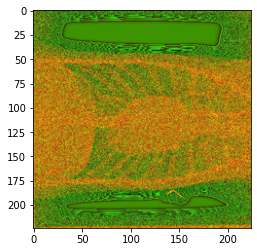

true: NF_09 pred: FL_09


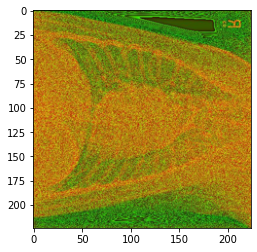

true: NF_18 pred: FL_18


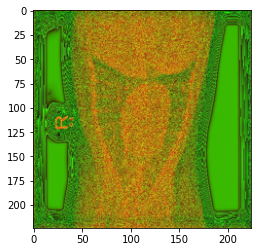

true: NF_18 pred: FL_18


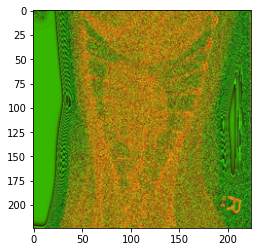

true: NF_18 pred: FL_18


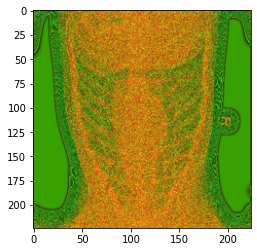

true: NF_18 pred: FL_18


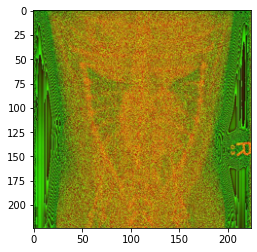

true: NF_18 pred: FL_18


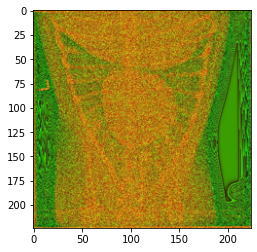

true: NF_18 pred: FL_18


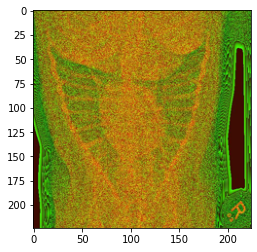

true: NF_18 pred: FL_18


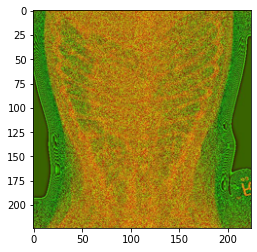

true: NF_18 pred: FL_18


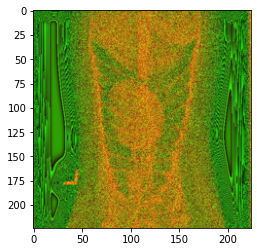

true: NF_18 pred: FL_18


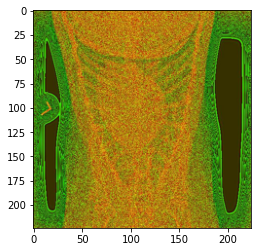

true: NF_27 pred: FL_27


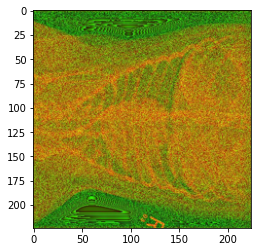

true: NF_27 pred: FL_27


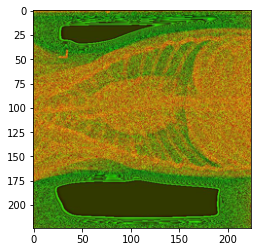

true: NF_27 pred: FL_27


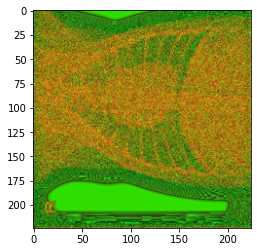

true: NF_27 pred: FL_27


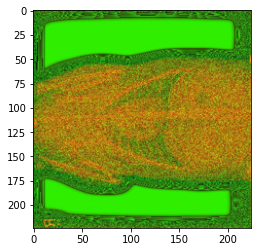

true: NF_27 pred: FL_27


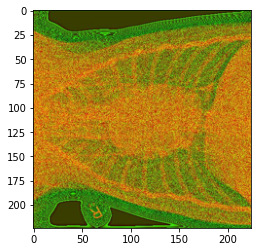

true: NF_27 pred: FL_27


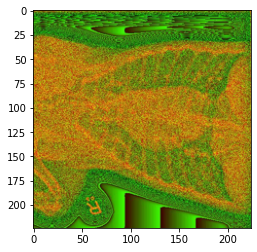

true: NF_27 pred: FL_27


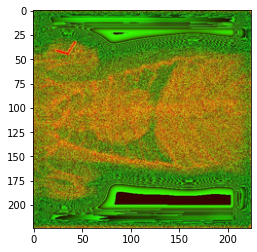

In [35]:
for i in range(len(y_test)):
    if y_test[i] != test_pred_combined[i]:
        print(f'true: {y_test[i]} pred: {test_pred_combined[i]}')
        plt.imshow(X_test[i])
        plt.show()

In [ ]:
## Saving the results
# format ==> model_name img_type_used yyyymmddhhminmin testaccuracy

In [ ]:
model_save_as = model.name+'_'+imageType[:-1]+year+month+day+hour+minute+'_'+str(max(history.history['val_categorical_accuracy'])*100)[:2]+'p'+str(max(history.history['val_categorical_accuracy'])*100)[3:5]


In [119]:
year=str(datetime.datetime.today().year)
month=f'{datetime.datetime.today().month:02}'
day=f'{datetime.datetime.today().day:02}'
hour=f'{datetime.datetime.today().hour:02}'
minute=f'{datetime.datetime.today().minute:02}'
test_accuracy=f'{score[1]*100:2.2f}'

In [120]:
model_save_as = f'{model.name}_{imageType[:-1]}_{year}{month}{day}{hour}{minute}_{test_accuracy[:2]}p{test_accuracy[3:5]}'
print(model_save_as)
print(hour,minute)

EfNetB0_jpg_202203251400_85p42
14 00


In [121]:
model.save('SavedWeights/model_{model_save_as}.h5')
model.save_weights(f'SavedWeights/weights_{model_save_as}.h5')
base_model.save_weights(f'SavedWeights/weights_base_{model_save_as}.h5')
plt.savefig(f'outputFigures/ConfMat_{model_save_as}.jpg')

<Figure size 432x288 with 0 Axes>

## Visualizing the Model

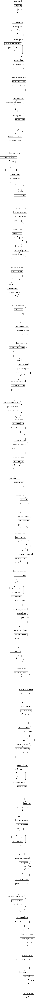

In [122]:
plot_model(base_model)

In [123]:
for i in range(len(base_model.layers)):
    layer = base_model.layers[i]
    # check for convolutional layer
    if 'conv' not in layer.name:
        continue
    # summarize output shape
    print(i, layer.name, layer.output.shape)

3 stem_conv_pad (None, 225, 225, 3)
4 stem_conv (None, 112, 112, 32)
7 block1a_dwconv (None, 112, 112, 32)
15 block1a_project_conv (None, 112, 112, 16)
17 block2a_expand_conv (None, 112, 112, 96)
20 block2a_dwconv_pad (None, 113, 113, 96)
21 block2a_dwconv (None, 56, 56, 96)
29 block2a_project_conv (None, 56, 56, 24)
31 block2b_expand_conv (None, 56, 56, 144)
34 block2b_dwconv (None, 56, 56, 144)
42 block2b_project_conv (None, 56, 56, 24)
46 block3a_expand_conv (None, 56, 56, 144)
49 block3a_dwconv_pad (None, 59, 59, 144)
50 block3a_dwconv (None, 28, 28, 144)
58 block3a_project_conv (None, 28, 28, 40)
60 block3b_expand_conv (None, 28, 28, 240)
63 block3b_dwconv (None, 28, 28, 240)
71 block3b_project_conv (None, 28, 28, 40)
75 block4a_expand_conv (None, 28, 28, 240)
78 block4a_dwconv_pad (None, 29, 29, 240)
79 block4a_dwconv (None, 14, 14, 240)
87 block4a_project_conv (None, 14, 14, 80)
89 block4b_expand_conv (None, 14, 14, 480)
92 block4b_dwconv (None, 14, 14, 480)
100 block4b_project_

In [124]:
from keras.preprocessing import image
from tensorflow.keras.models import Model
layer_to_sample=15
act_model = Model(inputs=base_model.inputs, outputs = base_model.layers[layer_to_sample].output)
img_to_load="FL_18_208190a42_145342.jpg"
img = image.load_img(folderTest+img_to_load, target_size=(224, 224))

# convert the image to an array
img = image.img_to_array(img)
# expand dimensions so that it represents a single 'sample'
img = np.expand_dims(img, axis=0)
# prepare the image (e.g. scale pixel values for the vgg)


feature_maps = act_model.predict(img)
labels = ['FL_00','FL_09','FL_18','FL_27','NF_00','NF_09','NF_18','NF_27']
print(labels[np.argmax(model.predict(img))])

FL_18


In [125]:
print(feature_maps.shape)
fig_save_as = model.name+f'_layer{layer_to_sample:03}_'+year+month+day+hour+minute+'_'+str(max(history.history['val_categorical_accuracy'])*100)[:2]+'p'+str(max(history.history['val_categorical_accuracy'])*100)[3:5]+img_to_load
print(fig_save_as)

(1, 112, 112, 16)
EfNetB0_layer015_202203251400_93p75FL_18_208190a42_145342.jpg


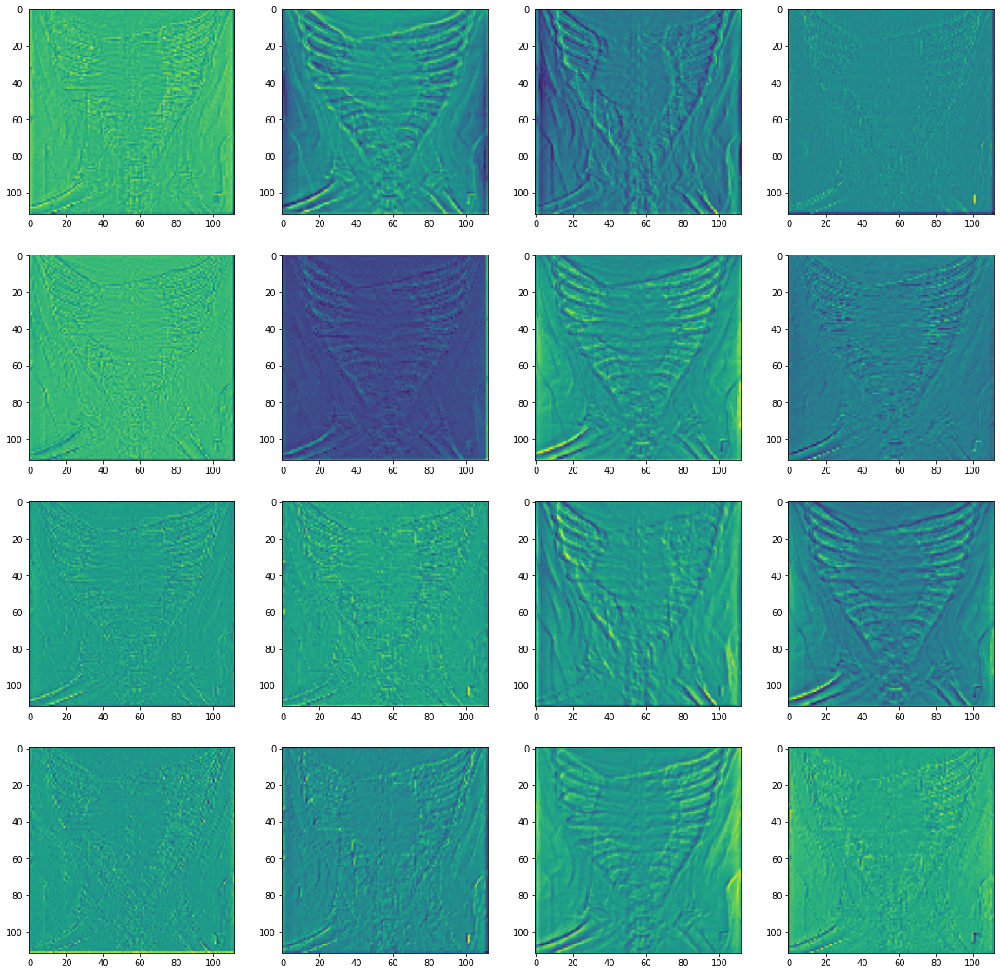

In [127]:
#for i in range(0,3):
#    plt.imshow(feature_maps[0,:,:,i], cmap='gray')
#    plt.show()
    #else:
        #fm = fm + np.array(feature_maps[0,:,:,i])
evXimg=1
plt.figure(figsize=(20,20))
for i in range(16*evXimg):
    if i%evXimg ==0:
        plt.subplot(4,4,int(i/evXimg)+1)
        plt.imshow(feature_maps[0,:,:,i])
plt.savefig(f'outputFigures/LayerAct{layer_to_sample:03}_{model_save_as}')
plt.show()


In [28]:
def plot_gallery(images, titles, h, w, n_row=3, n_col=4):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(1.8 * n_col, 2.4 * n_row))
    plt.subplots_adjust(bottom=0, left=0.01, right=0.99, top=0.90, hspace=0.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[i].reshape((h, w)), cmap=plt.cm.gray)
        plt.title(titles[i], size=12)
        plt.xticks(())
        plt.yticks(())
